In [1]:
import scipy.signal as sig

In [2]:
import cv2
import numpy as np
import pandas
import matplotlib.pyplot as plt
from skimage import io
import os
%matplotlib inline

In [3]:
!pwd
!ls
!ls dataset

/Users/kevinmiao/Desktop/SkinDetection
README.md                 setup.sh
dataset                   skin_bounding_boxes.ipynb
HAM10000_images_part_1
HAM10000_images_part_1.zip
HAM10000_images_part_2
HAM10000_images_part_2.zip
HAM10000_metadata
HAM10000_segmentations_lesion_tschandl.zip
ISIC2018_Task3_Test_Images.zip
ISIC2018_Task3_Test_NatureMedicine_AI_Interaction_Benefit.csv


In [4]:
cd dataset/HAM10000_images_part_1

/Users/kevinmiao/Desktop/SkinDetection/dataset/HAM10000_images_part_1


In [5]:
path = os.listdir()[49]
path

'ISIC_0024352.jpg'

(450, 600)


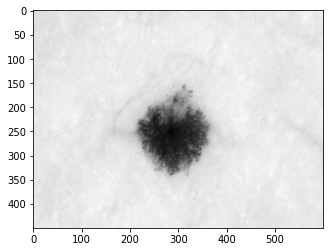

In [6]:
# im = io.imread(path)
im = io.imread(path, as_gray=True)
print(im.shape)
img = im

plt.imshow(im, cmap='gray')
# plt.waitKey(0)

In [7]:
im = io.imread(path)

In [9]:
imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 127, 255, 0)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

In [10]:
def bounding_box(im, contours):
    cv2.drawContours(im, contours, -1, 255, 3)

    # find the biggest countour (c) by the area

    # print(len(contours))
    temp = contours
    c = max(temp, key = cv2.contourArea)

    # print(np.array(temp)[0].shape) # (4, 1, 2) = 4 coordinates, each one is (x, y) pair
    # temp= temp.remove(temp[c])

    # Naively find the second largest bounding box
    c = np.inf
    counter = 0
    cont = {}
    for i in range(len(contours)):
        cont[i] = cv2.contourArea(contours[i])

    sorted_values = sorted(cont.values()) # Sort the values
    sorted_dict = {}

    for i in sorted_values:
        for k in cont.keys():
            if cont[k] == i:
                sorted_dict[k] = cont[k]
                break


    # Pull out second largest contour; form a bounding box
#     print(list(sorted_dict.keys())[-2])
    c = list(sorted_dict.keys())[-2]

    x,y,w,h = cv2.boundingRect(contours[c])
    return x, y, w, h 

21
197 152 180 195


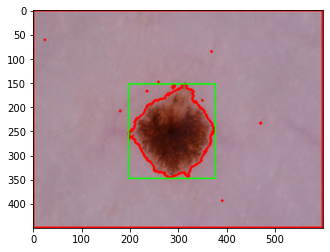

In [11]:
# contours
# plt.imshow(cv2.drawContours(im, contours, -1, (0,255,0), 3))

# draw in blue the contours that were founded
cv2.drawContours(im, contours, -1, 255, 3)

# find the biggest countour (c) by the area

# print(len(contours))
temp = contours
c = max(temp, key = cv2.contourArea)

# print(np.array(temp)[0].shape) # (4, 1, 2) = 4 coordinates, each one is (x, y) pair
# temp= temp.remove(temp[c])

# Naively find the second largest bounding box
c = np.inf
counter = 0
cont = {}
for i in range(len(contours)):
    cont[i] = cv2.contourArea(contours[i])

sorted_values = sorted(cont.values()) # Sort the values
sorted_dict = {}

for i in sorted_values:
    for k in cont.keys():
        if cont[k] == i:
            sorted_dict[k] = cont[k]
            break

            
# Pull out second largest contour; form a bounding box
print(list(sorted_dict.keys())[-2])
c = list(sorted_dict.keys())[-2]

x,y,w,h = cv2.boundingRect(contours[c])
print(x, y, w, h)

plt.imshow(cv2.rectangle(im,(x,y),(x+w,y+h),(0,255,0),2))
# cv2.waitKey(0)

# for i in sorted_dict.keys():
#     x,y,w,h = cv2.boundingRect(contours[i])
#     print(x, y, w, h)

#     cv2.imshow("image", cv2.rectangle(im,(x,y),(x+w,y+h),(0,255,0),2))
#     cv2.waitKey(0)

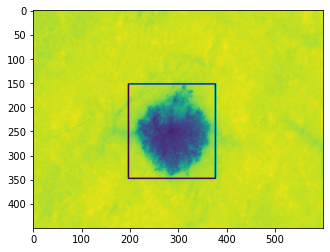

In [12]:
plt.imshow(cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2))

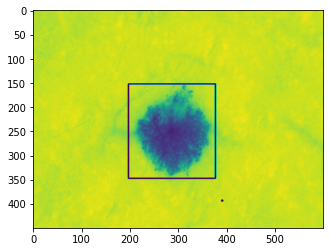

In [13]:
rect = cv2.minAreaRect(contours[0])
box = cv2.boxPoints(rect)
box = np.int0(box)
plt.imshow(cv2.drawContours(img,[box],0,(0,0,255),2))
# cv2.waitKey(0)

## Test

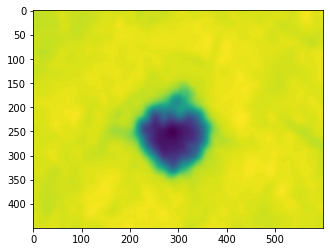

In [38]:
blur = cv2.GaussianBlur(imgray, (21,21), 15.0)
plt.imshow(blur)

### Blurs/Filters

In [39]:
import skimage

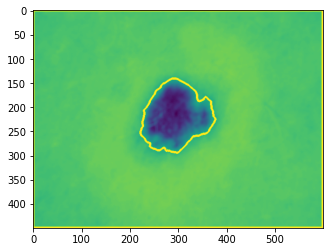

In [57]:
plt.imshow(skimage.exposure.adjust_gamma(blurred, 0.5))

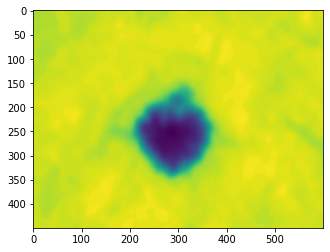

In [83]:
plt.imshow(skimage.exposure.adjust_gamma(blur, 1.5))

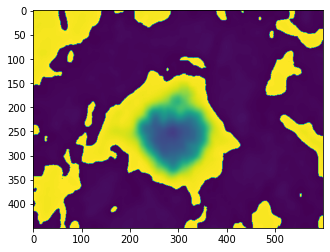

In [84]:
plt.imshow(skimage.exposure.adjust_log(blur, 1.5))

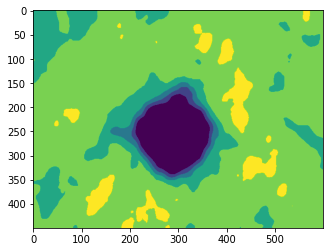

In [96]:
plt.imshow(skimage.exposure.adjust_sigmoid(blur, 10e-1))

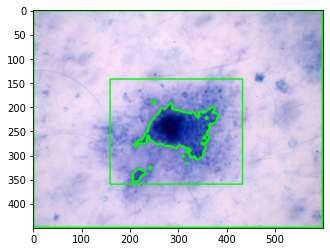

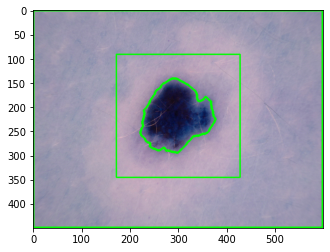

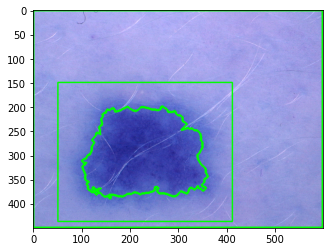

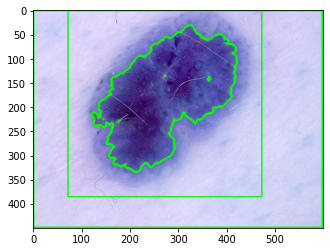

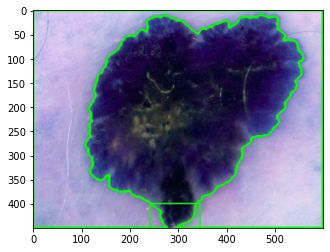

...

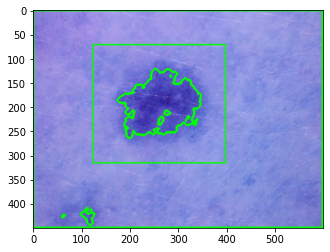

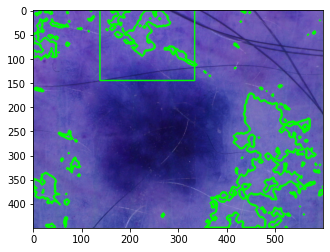

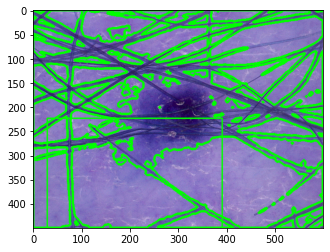

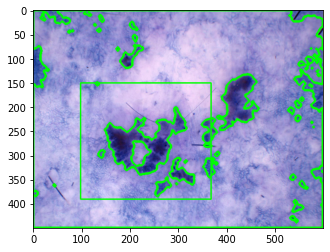

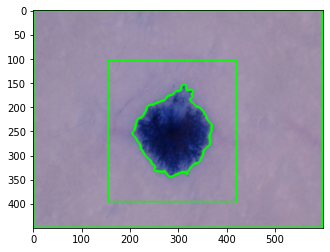

In [98]:
kernel = (21, 21)
simga = 15.0
pad = 50
extra = 100
gamma =  1.75
for i in range(50):
    im = cv2.imread(os.listdir()[i], 1)
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(imgray, (7,7), 5.0)
    ret, thresh = cv2.threshold(blurred, 127, 255, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    x,y,w,h = bounding_box(high_contrast, contours)
    x = int(x - pad)
    y = int(y - pad)
    w = int(w + extra)
    h = int(h + extra)
    plt.imshow(im)
    plt.imshow(cv2.rectangle(im,(x,y),(x+w,y+h),(0,255,0),2))


    plt.imshow(cv2.drawContours(im, contours, -1, (0,255,0), 3))
    plt.show()

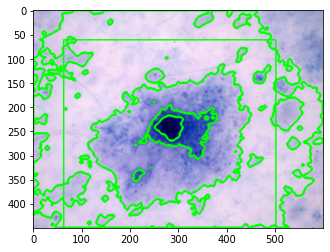

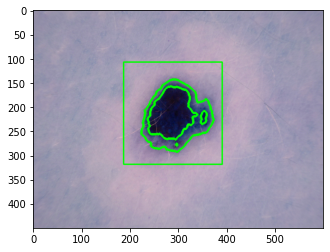

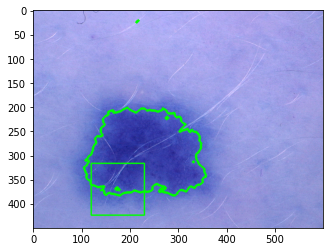

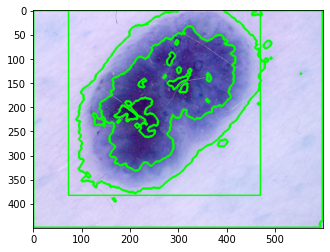

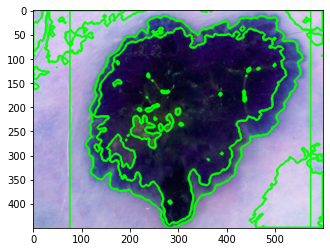

...

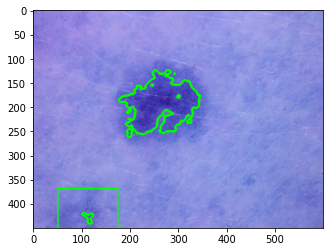

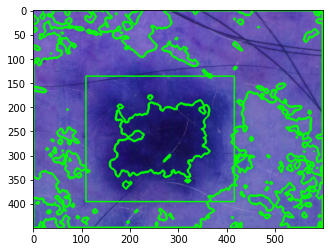

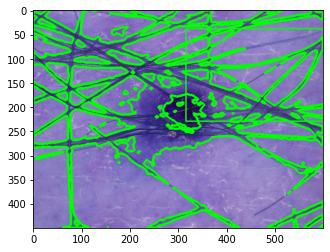

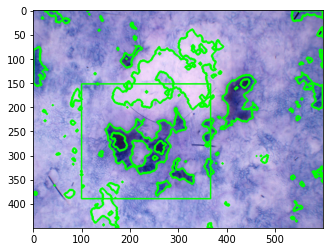

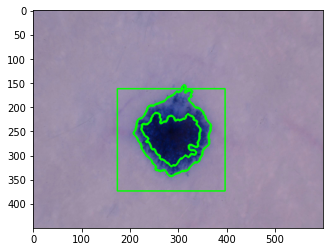

In [105]:
kernel = (9, 9)
simga = 15.0
pad = 50
extra = 100
gamma =  1.75
for i in range(50):
    im = cv2.imread(os.listdir()[i], 1)
    imgray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(imgray, (7,7), 5.0)
    high_contrast = skimage.exposure.adjust_log(blurred, gamma)
#     high_contrast = blurred
    ret, thresh = cv2.threshold(high_contrast, 127, 255, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    x,y,w,h = bounding_box(high_contrast, contours)
    x = int(x - pad)
    y = int(y - pad)
    w = int(w + extra)
    h = int(h + extra)
    plt.imshow(im)
    plt.imshow(cv2.rectangle(im,(x,y),(x+w,y+h),(0,255,0),2))


    plt.imshow(cv2.drawContours(im, contours, -1, (0,255,0), 3))
    plt.show()